## Importar data

In [1]:
from ucimlrepo import fetch_ucirepo 
import numpy as np

factoresRiesgoCancerCerical = fetch_ucirepo(id=383) 

X = factoresRiesgoCancerCerical.data.features 
y = factoresRiesgoCancerCerical.data.targets 

In [2]:
X.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,NaN,NaN,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0


## Análisis exploratorio

Automatizado con ProfileReport

In [3]:
import pandas as pd
from pandas_profiling import ProfileReport

profile = ProfileReport(X, title="Profiling", explorative=True)
profile

/tmp/ipykernel_26886/261680822.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Análisis de variables

In [4]:
pd.set_option('display.max_columns', None)
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 858 non-null    int64  
 1   Number of sexual partners           832 non-null    float64
 2   First sexual intercourse            851 non-null    float64
 3   Num of pregnancies                  802 non-null    float64
 4   Smokes                              845 non-null    float64
 5   Smokes (years)                      845 non-null    float64
 6   Smokes (packs/year)                 845 non-null    float64
 7   Hormonal Contraceptives             750 non-null    float64
 8   Hormonal Contraceptives (years)     750 non-null    float64
 9   IUD                                 741 non-null    float64
 10  IUD (years)                         741 non-null    float64
 11  STDs                                753 non-n

In [5]:
columnas_continuas = []
for column in X.columns:
    if X[X[column] % 1 != 0].dropna().shape[0] != 0:
        columnas_continuas.append(column)

columnas_continuas

['Smokes (years)',
 'Smokes (packs/year)',
 'Hormonal Contraceptives (years)',
 'IUD (years)']

In [6]:
unique_values = list(X.nunique())
columnas_categoricas = [column for column in list(X.columns) if unique_values[list(X.columns).index(column)] <= 2]
columnas_categoricas

['Smokes',
 'Hormonal Contraceptives',
 'IUD',
 'STDs',
 'STDs:condylomatosis',
 'STDs:cervical condylomatosis',
 'STDs:vaginal condylomatosis',
 'STDs:vulvo-perineal condylomatosis',
 'STDs:syphilis',
 'STDs:pelvic inflammatory disease',
 'STDs:genital herpes',
 'STDs:molluscum contagiosum',
 'STDs:AIDS',
 'STDs:HIV',
 'STDs:Hepatitis B',
 'STDs:HPV',
 'Dx:Cancer',
 'Dx:CIN',
 'Dx:HPV',
 'Dx',
 'Hinselmann',
 'Schiller',
 'Citology',
 'Biopsy']

In [7]:
columnas_numericas = [col for col in X.columns if col not in columnas_categoricas]
columnas_numericas

['Age',
 'Number of sexual partners',
 'First sexual intercourse',
 'Num of pregnancies',
 'Smokes (years)',
 'Smokes (packs/year)',
 'Hormonal Contraceptives (years)',
 'IUD (years)',
 'STDs (number)',
 'STDs: Number of diagnosis',
 'STDs: Time since first diagnosis',
 'STDs: Time since last diagnosis']

In [8]:
X_numericas = X[columnas_numericas]
X_categoricas = X[columnas_categoricas]

### Gráficos exploratorios

In [14]:
def plot_histogram(data, variable):
    plt.figure(figsize=(10, 6))
    sns.histplot(data[variable], kde=True)
    plt.title(f'Histograma de {variable}')
    plt.xlabel(variable)
    plt.ylabel('Frecuencia')
    plt.show()

def plot_boxplot(data, variable):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=data[variable])
    plt.title(f'Diagrama de Caja de {variable}')
    plt.xlabel(variable)
    plt.show()

def plot_line(data, variable):
    plt.figure(figsize=(10, 6))
    plt.plot(data[variable], marker='o')
    plt.title(f'Gráfica de Líneas de {variable}')
    plt.xlabel('Índice')
    plt.ylabel(variable)
    plt.show()
    
def plot_scatter(data, x_variable, y_variable):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=data[x_variable], y=data[y_variable])
    plt.title(f'Gráfica de Dispersión de {x_variable} vs {y_variable}')
    plt.xlabel(x_variable)
    plt.ylabel(y_variable)
    plt.show()

In [35]:
import random
n = random.randint(1,20)
n

6

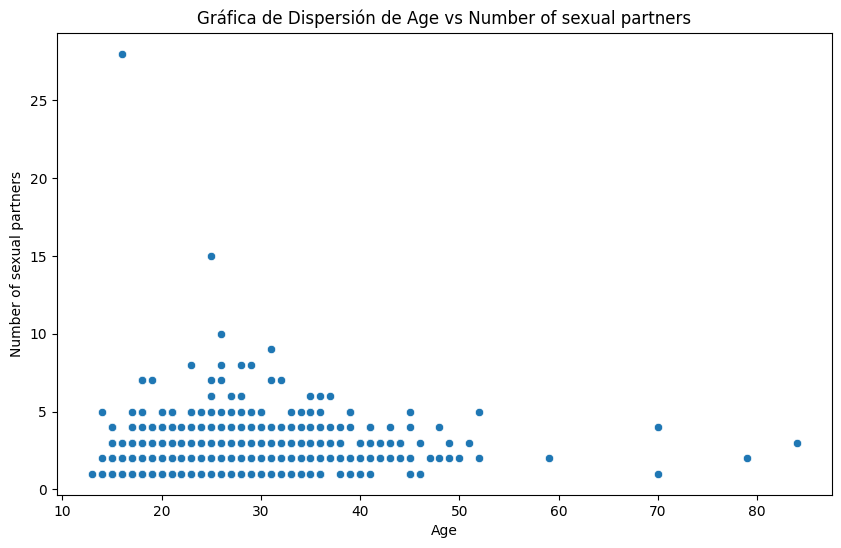

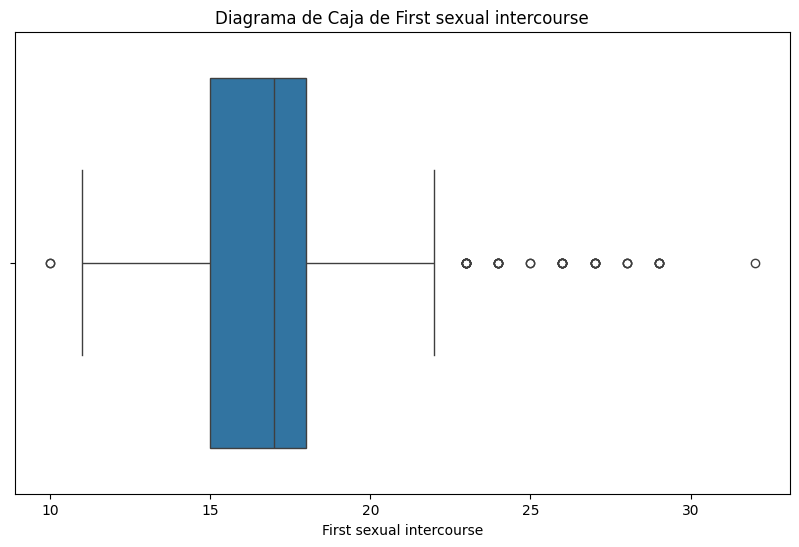

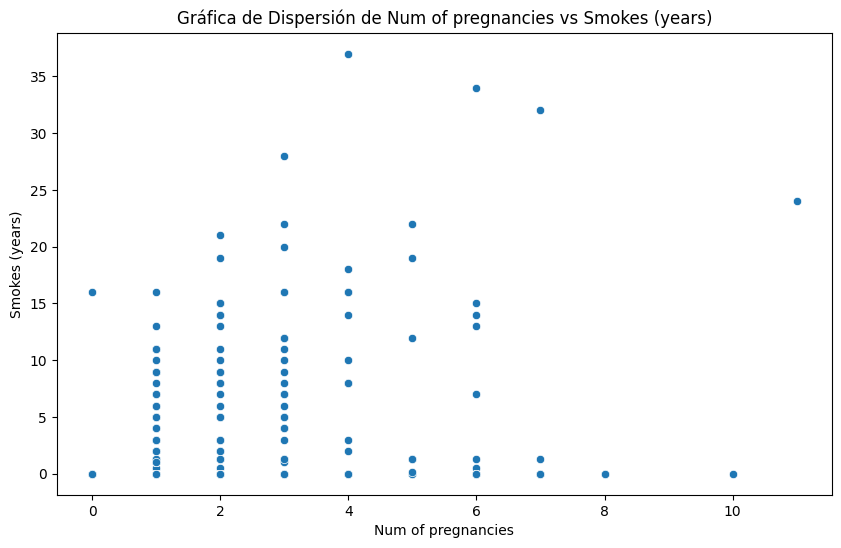

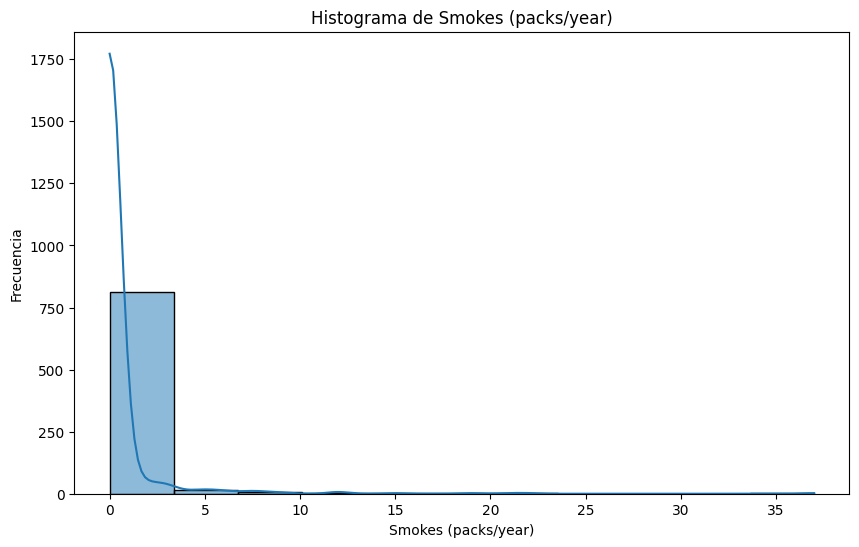

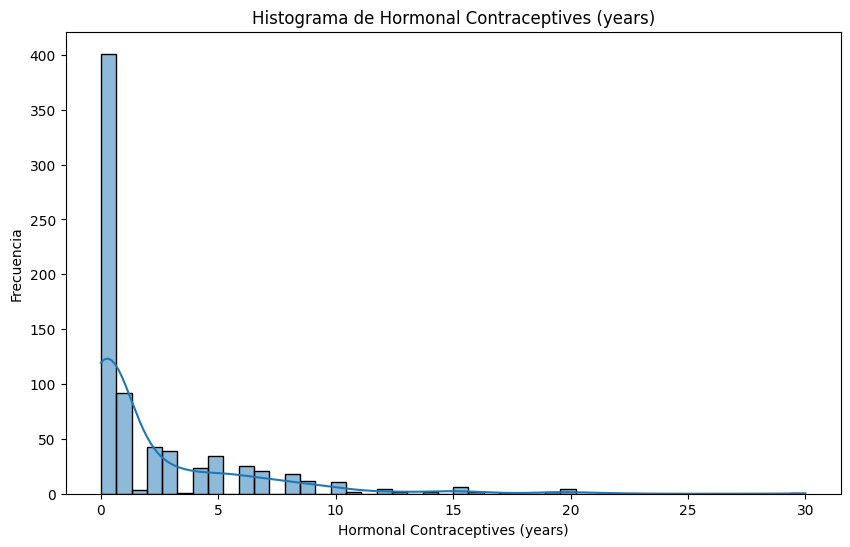

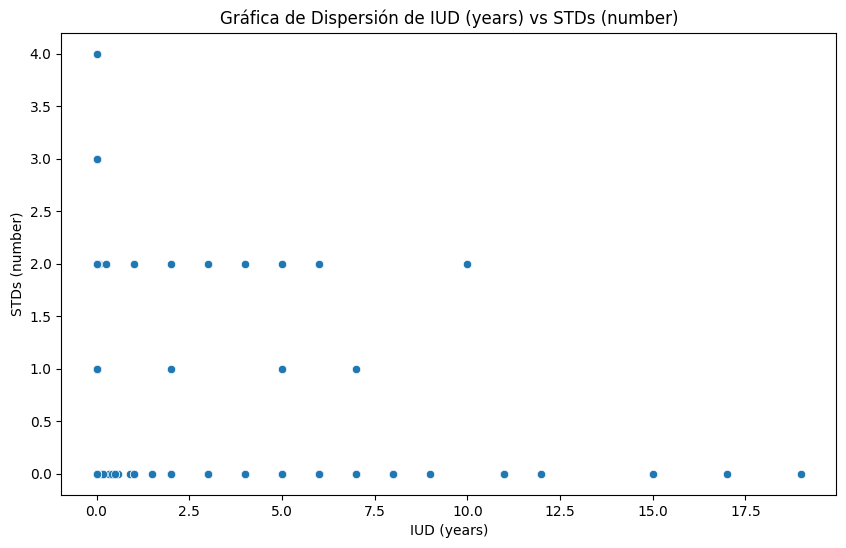

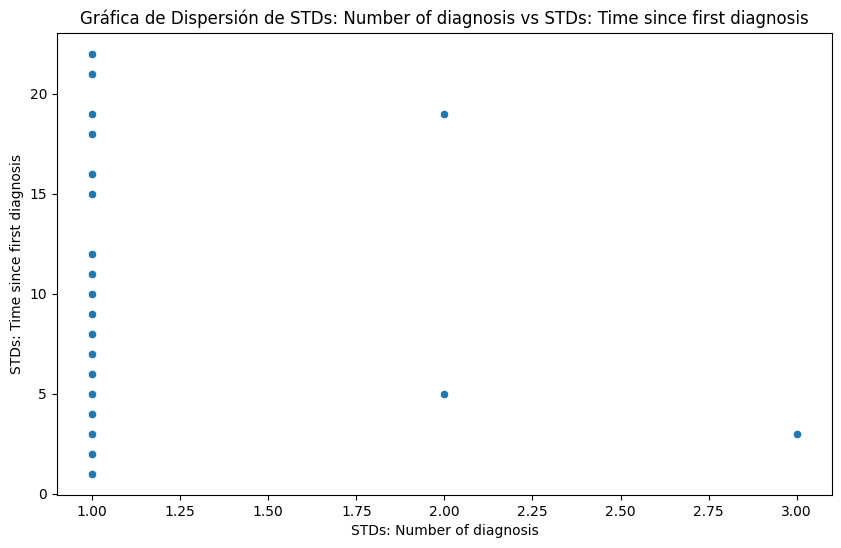

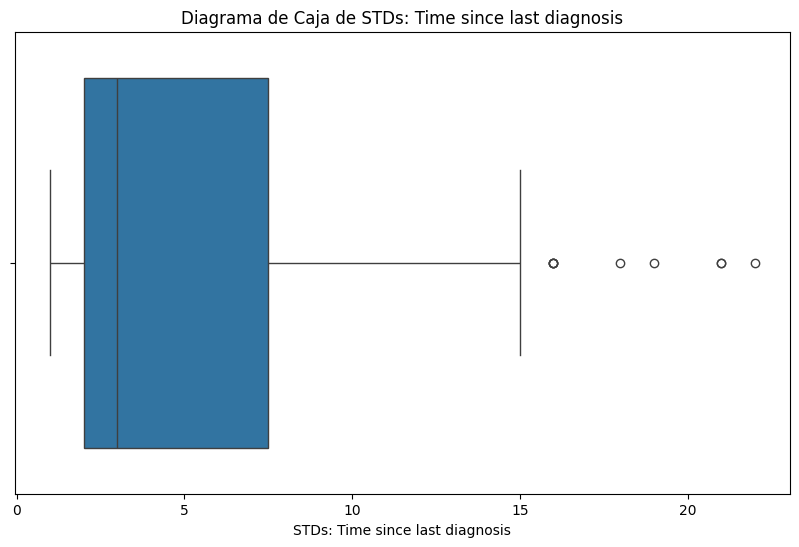

In [39]:
import random
prev_scatter = False
scatter_X = None
for column in columnas_numericas:
    if prev_scatter:
        plot_scatter(X,scatter_X,column)
        prev_scatter = False
        scatter_X = None
        continue
    n = random.randint(1,15)
    
    if n < 5:
        plot_boxplot(X, column)
    elif n < 10:
        plot_histogram(X,column)
    else:
        prev_scatter = True
        scatter_X = column

Text(0.5, 1.0, 'Matriz de Correlación - Variables Numéricas')

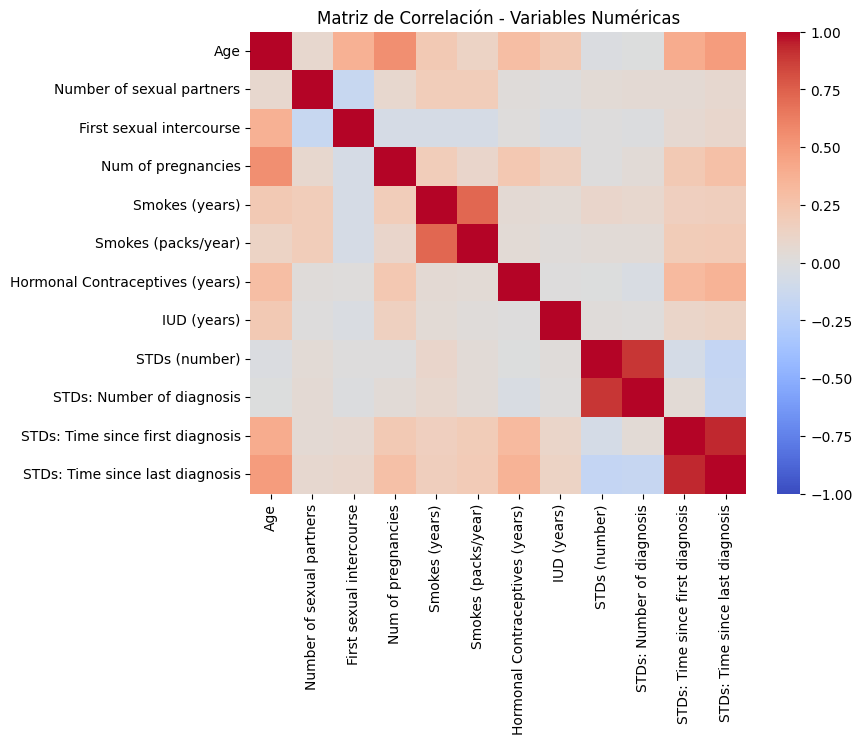

In [9]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(X_numericas.corr(), annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlación - Variables Numéricas')

Text(0.5, 1.0, 'Matriz de Correlación - Variables Categóricas')

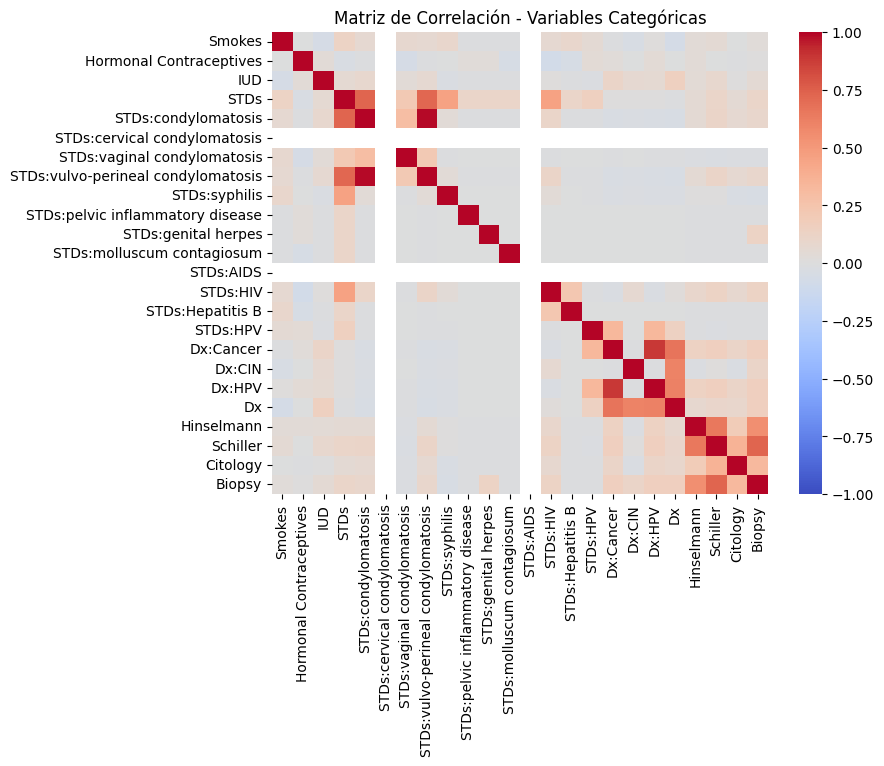

In [10]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(X_categoricas.corr(), annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlación - Variables Categóricas')

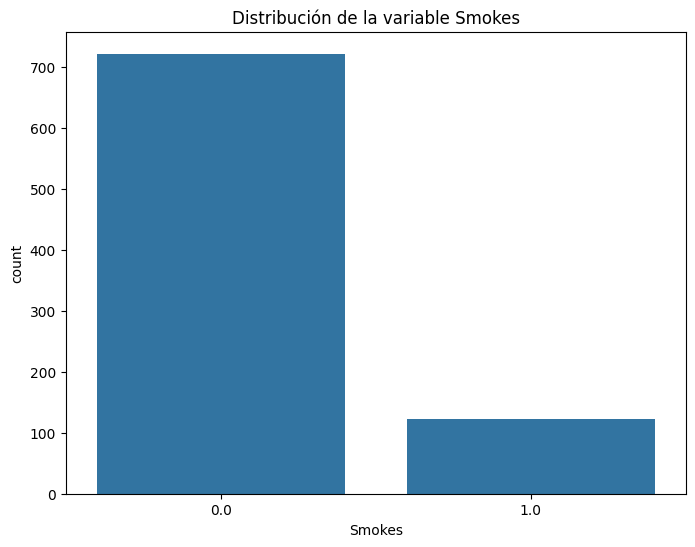

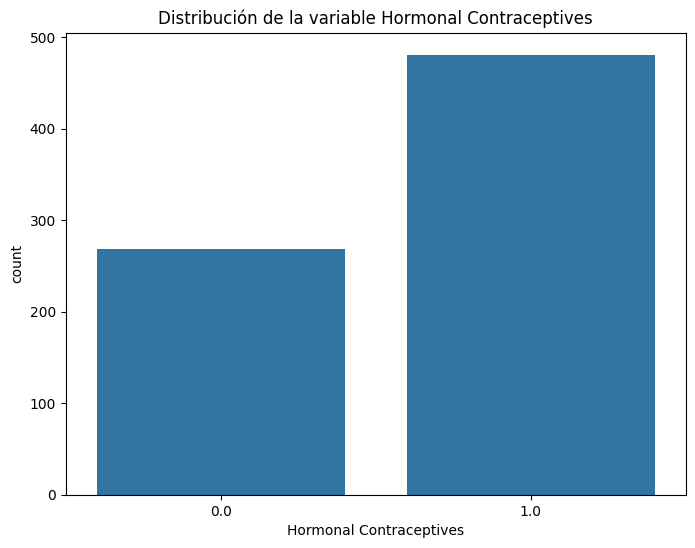

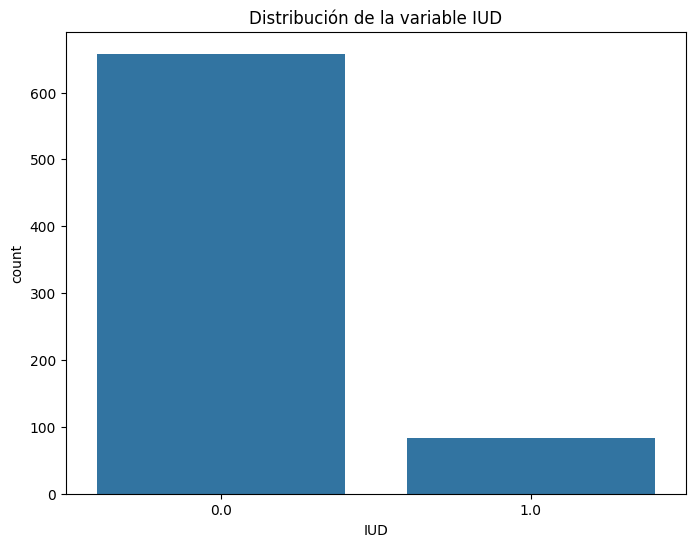

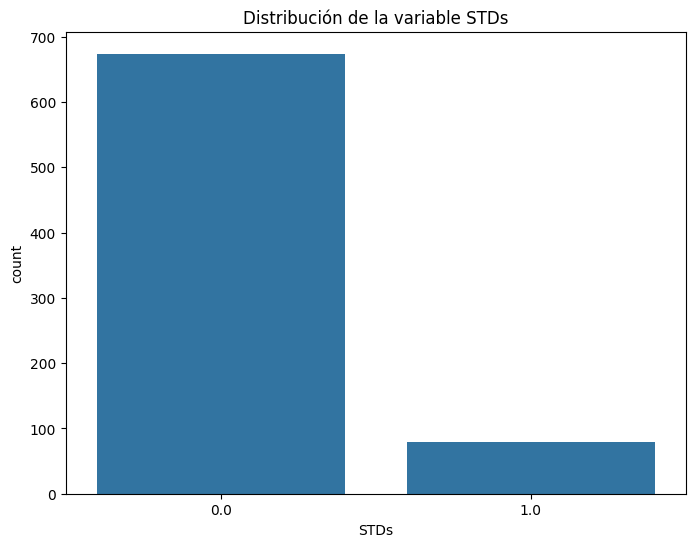

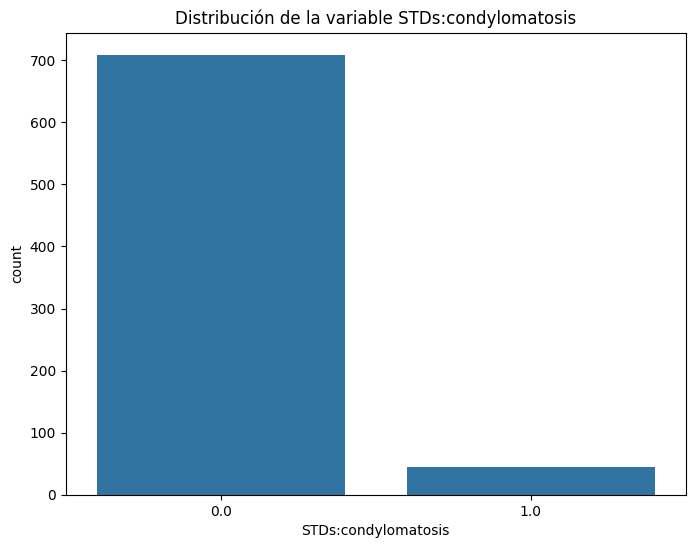

...

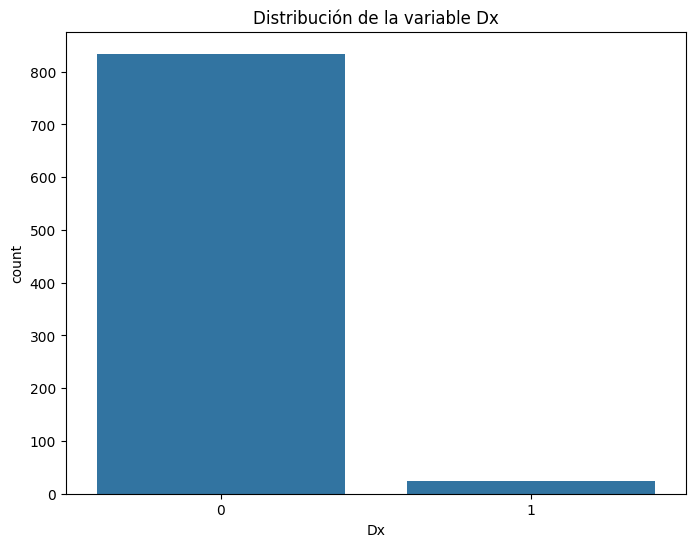

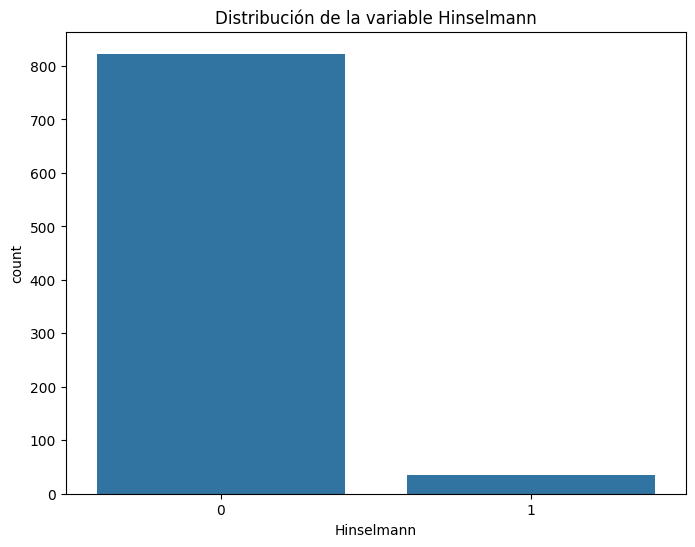

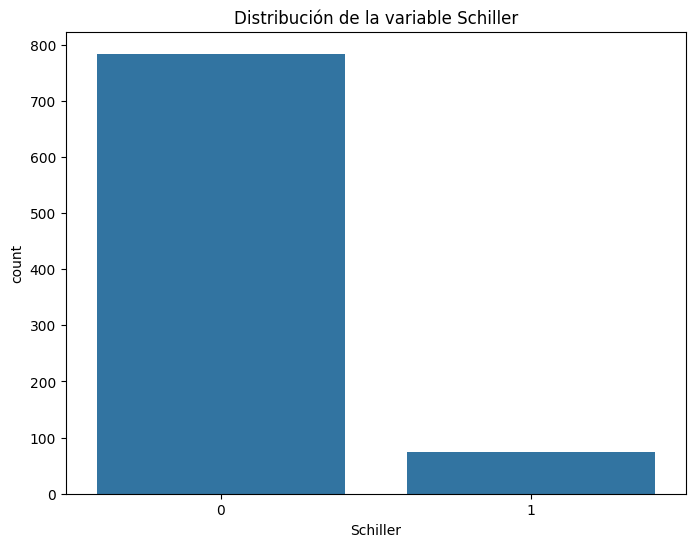

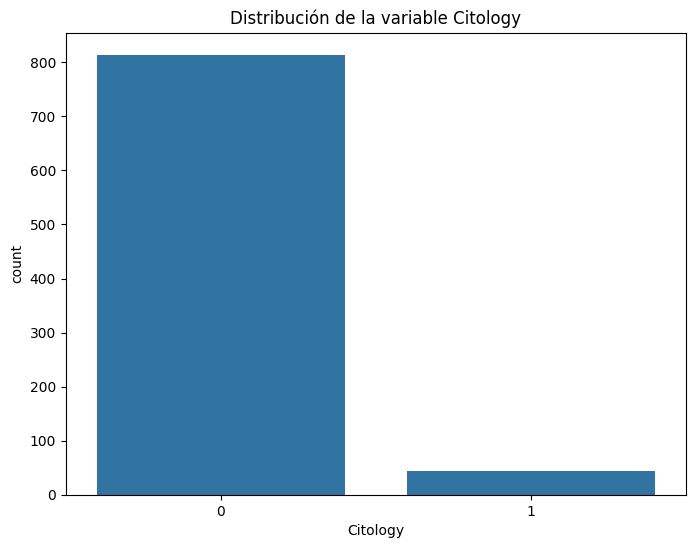

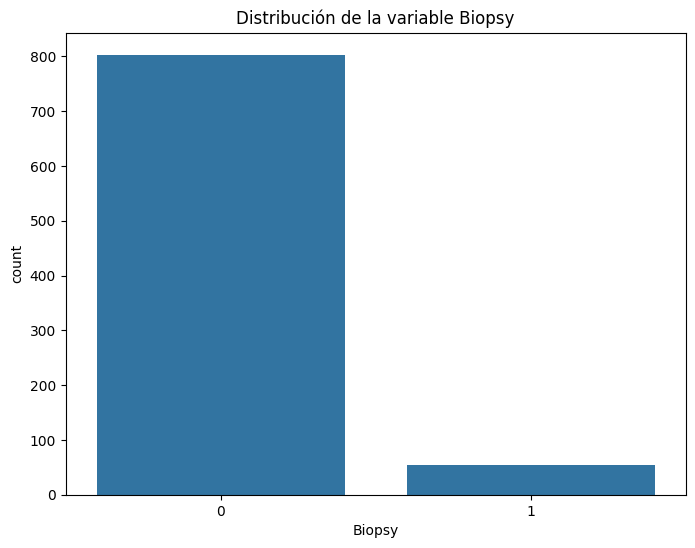

In [11]:
for categorica in X_categoricas:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=categorica, data=X_categoricas)
    plt.title('Distribución de la variable ' + categorica)
    plt.show()

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


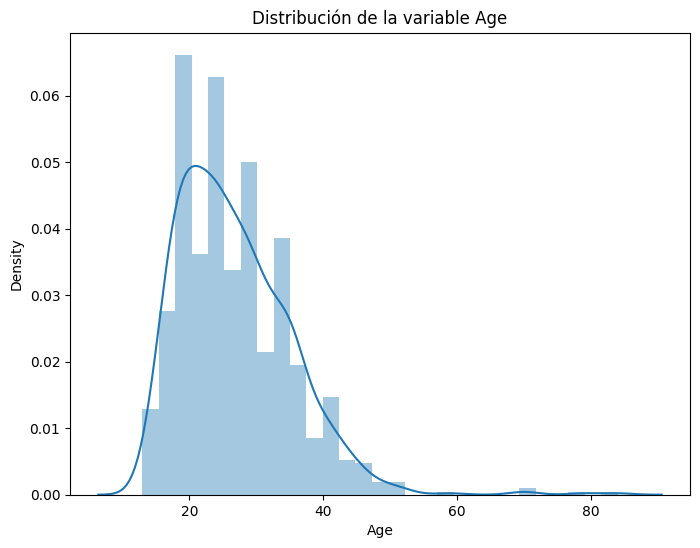

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


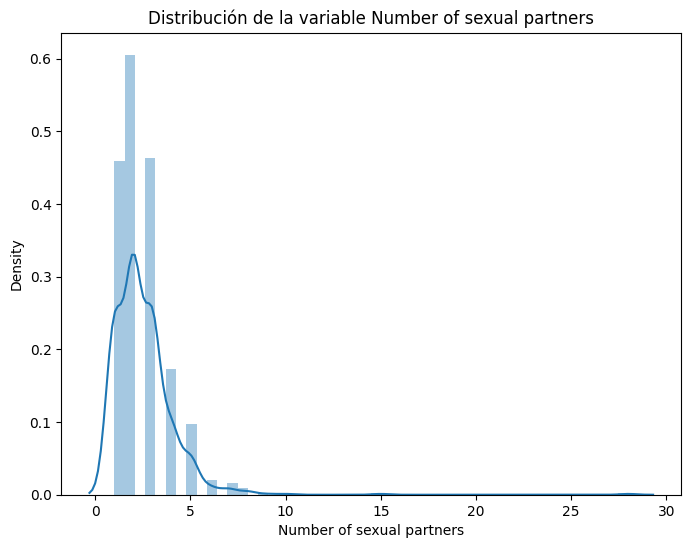

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


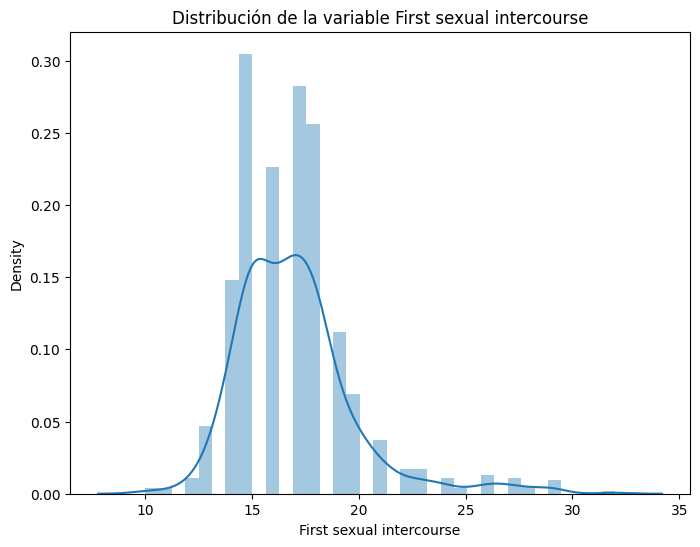

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


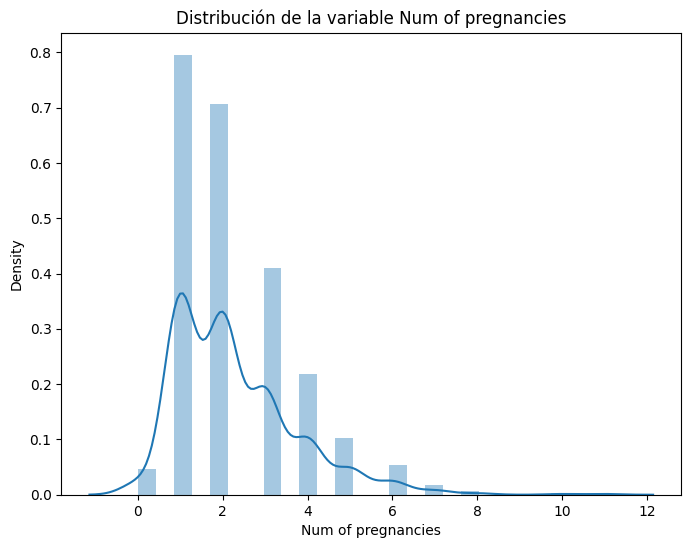

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


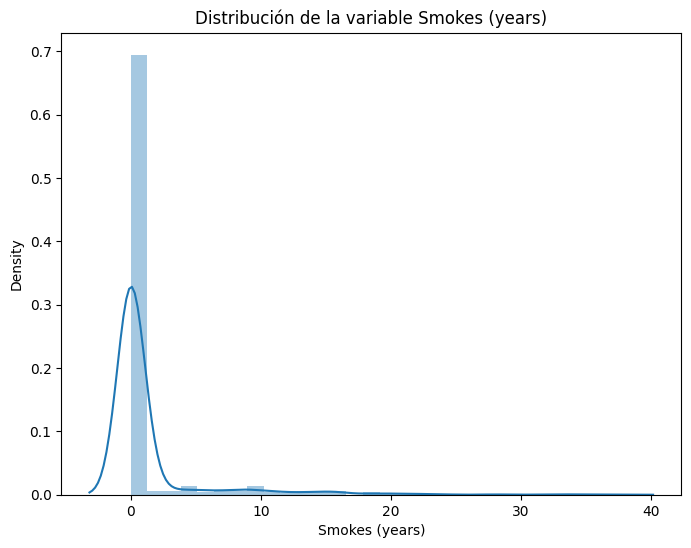

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


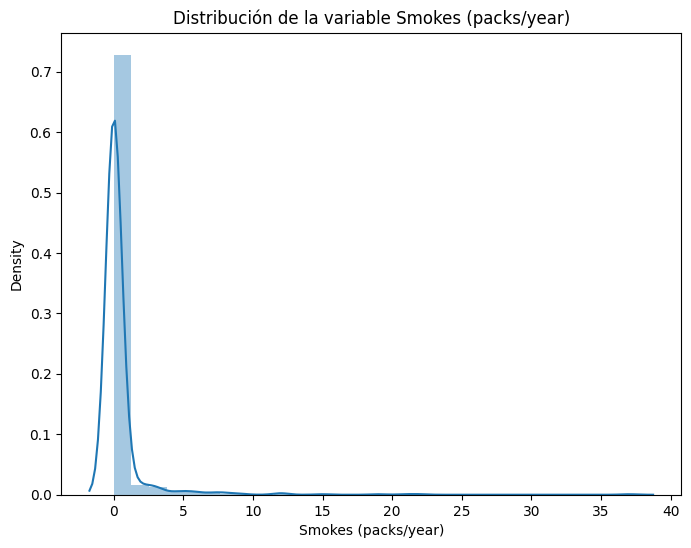

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


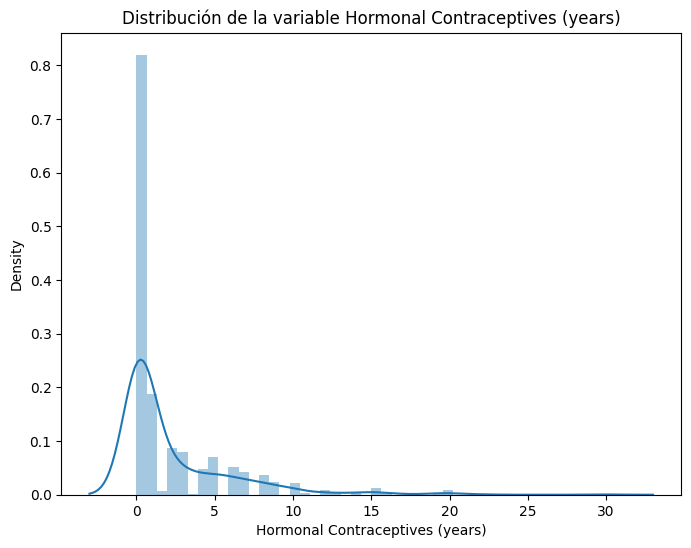

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


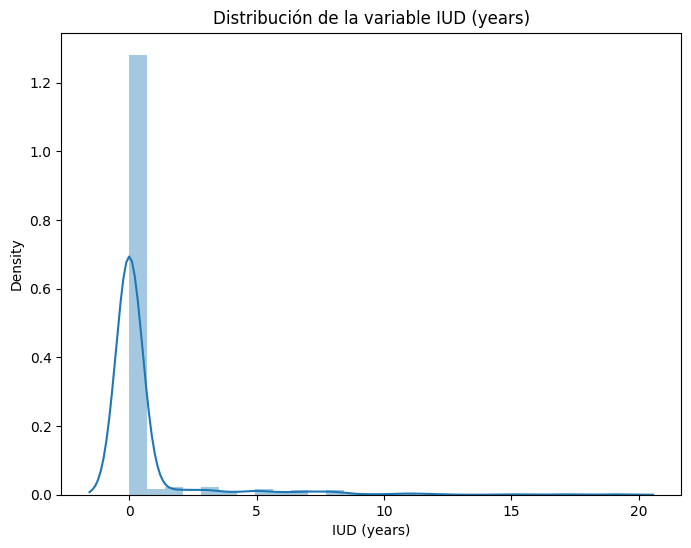

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


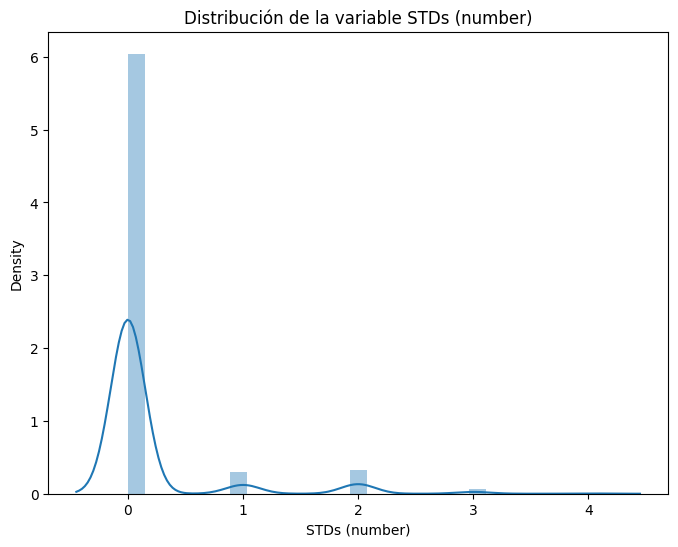

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


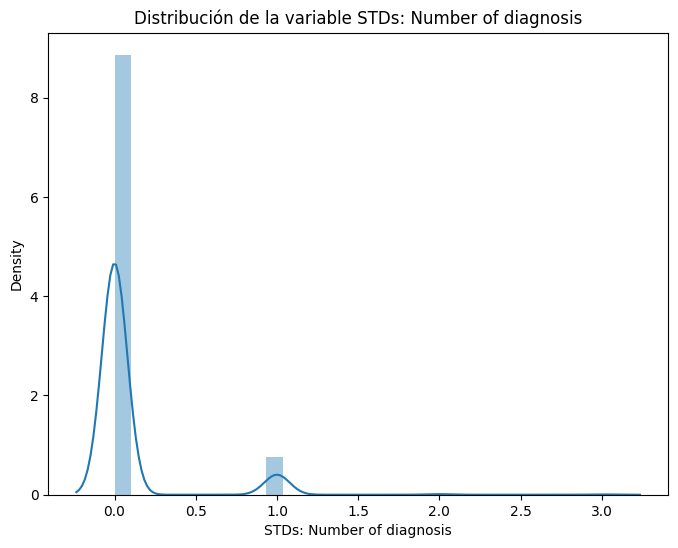

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


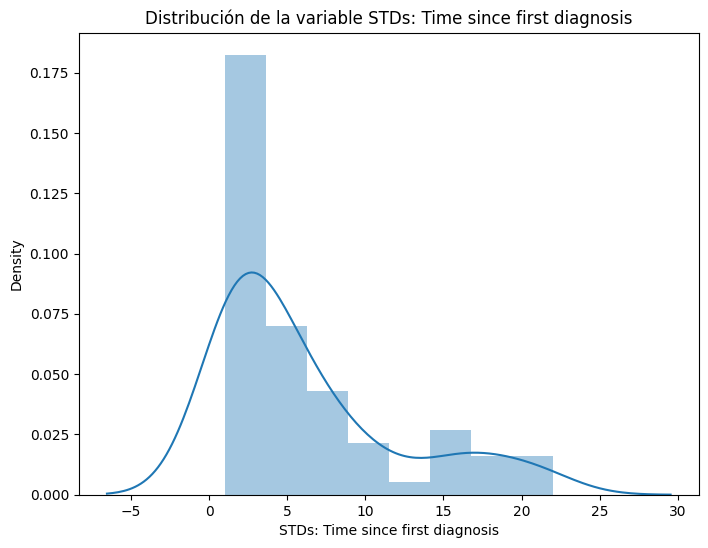

/tmp/ipykernel_26886/1603690092.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(X_numericas[numerica])


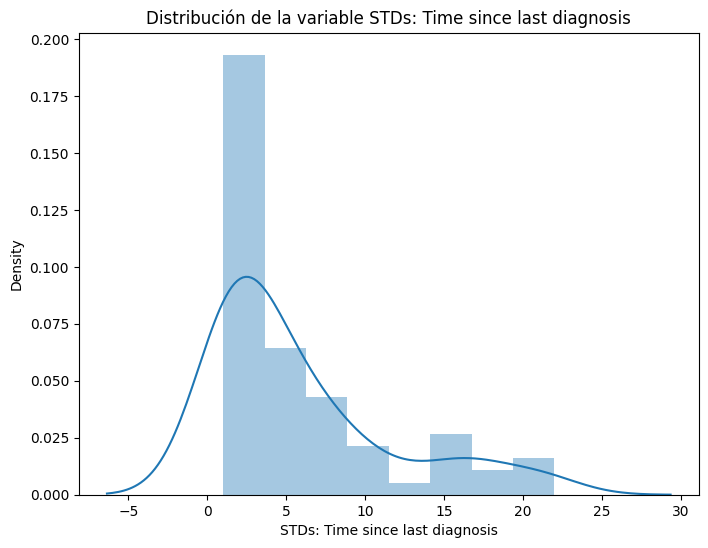

In [12]:
# Numericas
for numerica in X_numericas:
    plt.figure(figsize=(8, 6))
    sns.distplot(X_numericas[numerica])
    plt.title('Distribución de la variable ' + numerica)
    plt.show()

In [ ]:
#Boxplots
for numerica in X_numericas:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=X_numericas[numerica])
    plt.title('Distribución de la variable ' + numerica)
    plt.show()